# Import dependencies

In [1]:
#!pip install category_encoders

In [2]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score

In [3]:
df = pd.read_excel('furniture sales\Sample - Superstore-newdate.xlsx')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,2022-11-07,2022-11-10,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2022-11-07,2022-11-10,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2022-06-11,2022-06-15,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2021-10-09,2021-10-16,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2021-10-09,2021-10-16,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [4]:
df['per_unit_price'] = df['Sales'] / df['Quantity']
df['per_unit_profit'] = df['Profit'] / df['Quantity']
df['Profit_margin'] = df['Profit'] / df['Sales']
df['Original_Price'] = df['Sales'] / (1 - df['Discount'])
df['original_per_unit_price'] = df['Original_Price'] / df['Quantity']

In [5]:
df['order_month'] = df['Order Date'].dt.month
df['order_year'] = df['Order Date'].dt.year

In [6]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
def analyze_and_filter_column(df, column_name):
    # Convert column to list and plot boxplot
    column_data = df[column_name].tolist()
    fig, ax = plt.subplots()
    ax.set_title(f'{column_name} Boxplot')
    ax.set_ylabel(column_name)
    ax.boxplot(column_data)
    plt.show()

    # Calculate quartiles and IQR
    quartiles = df[column_name].quantile([.25, .5, .75])
    lowerq = quartiles[0.25]
    upperq = quartiles[0.75]
    iqr = upperq - lowerq

    # Print quartile information
    print(f"The lower quartile of {column_name} is: {lowerq}")
    print(f"The upper quartile of {column_name} is: {upperq}")
    print(f"The interquartile range of {column_name} is: {iqr}")
    print(f"The median of {column_name} is: {quartiles[0.5]} ")

    # Identify potential outliers
    lower_bound = lowerq - (1.5 * iqr)
    upper_bound = upperq + (1.5 * iqr)
    print(f"Values below {lower_bound} could be outliers.")
    print(f"Values above {upper_bound} could be outliers.")

    # Filter out potential outliers
    df_filtered = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]
    df_filtered = df_filtered.copy()

    # Return the filtered and binned DataFrame
    return df_filtered

In [8]:
column_name = 'Original_Price'
df = df.copy()
df = analyze_and_filter_column(df, column_name)

The lower quartile of Original_Price is: 21.36
The upper quartile of Original_Price is: 251.91
The interquartile range of Original_Price is: 230.55
The median of Original_Price is: 64.96 
Values below -324.46500000000003 could be outliers.
Values above 597.735 could be outliers.


C:\Users\yoeri\AppData\Local\Temp\ipykernel_24020\1531172447.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [9]:
df = df.drop(columns=["Discount", 'Row ID', 'Postal Code', 'Sales', 'Profit', 'per_unit_profit', 'Profit_margin',
                      "original_per_unit_price", "Order ID",'State', "Customer ID", "City", "Product Name", "Product ID", 
                      'per_unit_price','Country',"Customer Name","Ship Date",'Ship Mode','Segment'
                     ,'Quantity','Order Date'])

In [10]:
df = df.groupby(['order_year','order_month','Region','Category','Sub-Category'])['Original_Price'].sum().reset_index()

In [11]:
df

,order_year,order_month,Region,Category,Sub-Category,Original_Price
0,2020,1,Central,Furniture,Bookcases,141.96
1,2020,1,Central,Furniture,Furnishings,479.49
2,2020,1,Central,Office Supplies,Appliances,275.24
3,2020,1,Central,Office Supplies,Art,55.60
4,2020,1,Central,Office Supplies,Binders,129.28
...,...,...,...,...,...,...
2311,2023,12,West,Office Supplies,Paper,1392.38
2312,2023,12,West,Office Supplies,Storage,2430.64
2313,2023,12,West,Office Supplies,Supplies,73.13
2314,2023,12,West,Technology,Accessories,1387.72


In [12]:
df_2 = df.copy()

In [13]:
df.head()

,order_year,order_month,Region,Category,Sub-Category,Original_Price
0,2020,1,Central,Furniture,Bookcases,141.96
1,2020,1,Central,Furniture,Furnishings,479.49
2,2020,1,Central,Office Supplies,Appliances,275.24
3,2020,1,Central,Office Supplies,Art,55.60
4,2020,1,Central,Office Supplies,Binders,129.28


In [14]:
df = pd.get_dummies(df, columns=['Region','Category','Sub-Category'])

In [15]:
description = df.describe()
description

,order_year,order_month,Original_Price,Region_Central,Region_East,Region_South,Region_West,Category_Furniture,Category_Office Supplies,Category_Technology,...,Sub-Category_Envelopes,Sub-Category_Fasteners,Sub-Category_Furnishings,Sub-Category_Labels,Sub-Category_Machines,Sub-Category_Paper,Sub-Category_Phones,Sub-Category_Storage,Sub-Category_Supplies,Sub-Category_Tables
count,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,...,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000,2316.000000
mean,2021.565630,6.901554,419.493472,0.250000,0.259931,0.220207,0.269862,0.231865,0.599309,0.168826,...,0.055699,0.054404,0.079447,0.063903,0.014249,0.081606,0.075130,0.072539,0.045769,0.041451
std,1.124828,3.389321,453.746417,0.433106,0.438691,0.414476,0.443984,0.422115,0.490144,0.374679,...,0.229390,0.226862,0.270494,0.244633,0.118540,0.273823,0.263657,0.259434,0.209028,0.199373
min,2020.000000,1.000000,2.040000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2021.000000,4.000000,79.955000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2022.000000,7.000000,272.955000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2023.000000,10.000000,605.067500,0.250000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2023.000000,12.000000,3055.240000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [16]:
target = 'Original_Price'
features = df.columns.drop(target)
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.75, test_size=0.25, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1737, 26), (579, 26), (1737,), (579,))

In [17]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [18]:
model.score(X_test, y_test)

0.40267802036208167

In [19]:
df_2.head()

,order_year,order_month,Region,Category,Sub-Category,Original_Price
0,2020,1,Central,Furniture,Bookcases,141.96
1,2020,1,Central,Furniture,Furnishings,479.49
2,2020,1,Central,Office Supplies,Appliances,275.24
3,2020,1,Central,Office Supplies,Art,55.60
4,2020,1,Central,Office Supplies,Binders,129.28


In [83]:
df_2.describe()

,order_year,order_month,Original_Price
count,2316.000000,2316.000000,2316.000000
mean,2021.565630,6.901554,419.493472
std,1.124828,3.389321,453.746417
min,2020.000000,1.000000,2.040000
25%,2021.000000,4.000000,79.955000
50%,2022.000000,7.000000,272.955000
75%,2023.000000,10.000000,605.067500
max,2023.000000,12.000000,3055.240000


In [20]:
assert df.shape == (2316, 27)

In [21]:
assert df_2.shape == (2316, 6)

In [22]:
from sklearn.metrics import mean_absolute_error, r2_score
target = 'Original_Price'
y = df_2[target]
y_pred = [y.mean()] * len(y)
print('Mean Baseline:')
print('Mean Absolute Error', mean_absolute_error(y, y_pred))
print('R^2 score', r2_score(y, y_pred))

Mean Baseline:
Mean Absolute Error 338.1271557178269
R^2 score 0.0


In [23]:
#train = df_2[df_2['order_year'] <= 2021]
#val = df_2[df_2['order_year'] == 2022]
#test = df_2[df_2['order_year'] == 2023]
#train.shape, val.shape, test.shape

In [24]:
#random split of the dataset in three sections

# The splits are 60% training, 20% validation, and 20% test

# First, split the data into training and a temporary set (combining validation and test)
train, temp_df = train_test_split(df_2, test_size=0.34, random_state=42)  # 60% training, 40% temp

# Then, split the temporary set into validation and test sets
val, test = train_test_split(temp_df, test_size=0.5, random_state=42)  # Splits the temp into 50% validation, 50% test=

In [25]:
import pandas_profiling
train.profile_report()

C:\Users\yoeri\AppData\Local\Temp\ipykernel_24020\2522532513.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
features = ['Region','Category','Sub-Category']
target = 'Original_Price'

X_train = train[features]
X_val = val[features]
X_test = test[features]

y_train = train[target] 
y_val = val[target]
y_test = test[target]

In [27]:
# category_encoders is recommended, but not required
import category_encoders as ce

In [28]:
# use fit_transform method with train set
# use transform method with val / test sets 
encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)

In [29]:
X_train_encoded.head()

,Region_Central,Region_South,Region_East,Region_West,Category_Technology,Category_Office Supplies,Category_Furniture,Sub-Category_Accessories,Sub-Category_Appliances,Sub-Category_Envelopes,...,Sub-Category_Bookcases,Sub-Category_Binders,Sub-Category_Fasteners,Sub-Category_Paper,Sub-Category_Supplies,Sub-Category_Furnishings,Sub-Category_Copiers,Sub-Category_Labels,Sub-Category_Chairs,Sub-Category_Tables
942,1,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
365,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1234,0,0,1,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1345,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1037,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
# Ridge Regression:
# Don't need to do Ridge & Linear, just one or the other
# You should scale features when doing regularized regression,
# but it's not required for this Sprint Challenge

from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_val_scaled = scaler.transform(X_val_encoded)

ridge = RidgeCV()
ridge.fit(X_train_scaled, y_train)

RidgeCV()

In [31]:
X_train_scaled

array([[ 1.68785855, -0.53092296, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671,  1.88351242, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671, -0.53092296,  1.72004338, ..., -0.26462806,
        -0.26320945, -0.20040802],
       ...,
       [ 1.68785855, -0.53092296, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671,  1.88351242, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802],
       [-0.59246671,  1.88351242, -0.58138069, ..., -0.26462806,
        -0.26320945, -0.20040802]])

In [32]:
# Ridge Regression:
# Don't need to do Ridge & Linear, just one or the other
from sklearn.metrics import mean_absolute_error, r2_score

y_pred = ridge.predict(X_val_scaled)
print('Ridge Regression:')
print('Mean Absolute Error', mean_absolute_error(y_val, y_pred))
print('R^2 score', r2_score(y_val, y_pred))

Ridge Regression:
Mean Absolute Error 239.74748270726334
R^2 score 0.3123059283322802


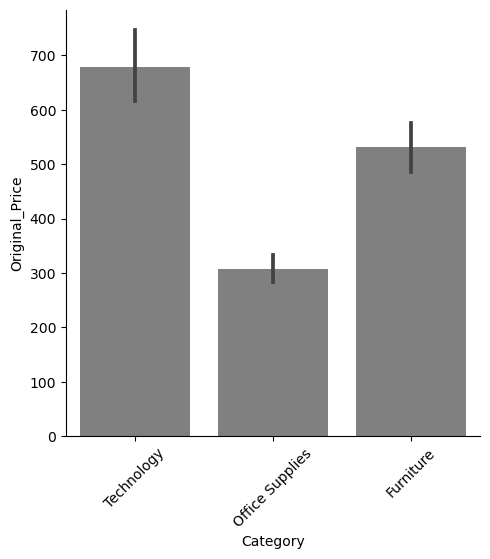

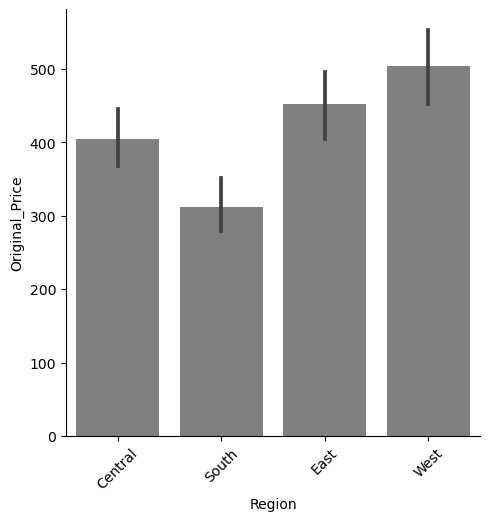

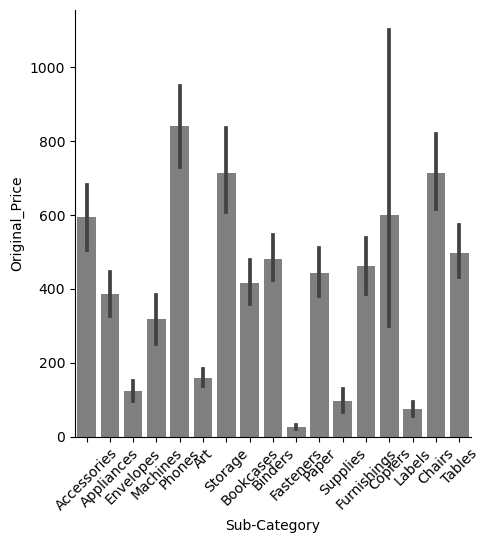

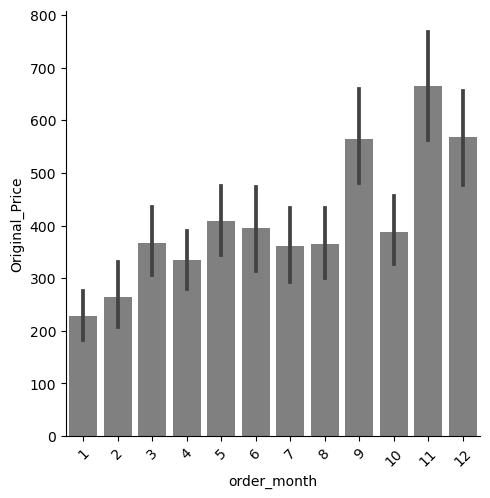

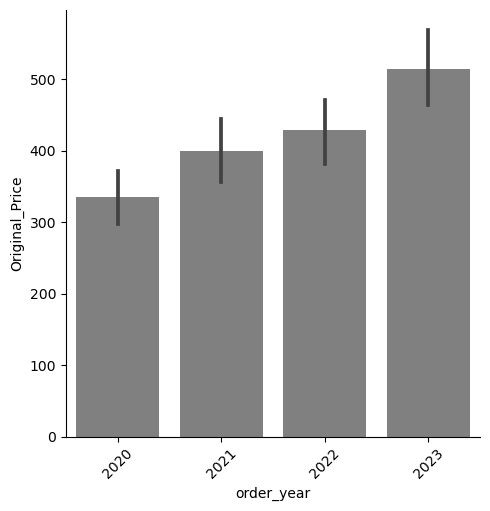

In [33]:
# Make visualizations to explore relationships between features and target
# You can visualize many features, or just a few.
# You do not need to use Seaborn, but it includes confidence intervals.
# Plotly and Pandas are also great for exploratory plots.

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

for col in sorted(train.columns):
    if train[col].nunique() <= 20:
        sns.catplot(x=col, y='Original_Price', data=train, kind='bar', color='grey')
        plt.xticks(rotation=45)
        plt.show()

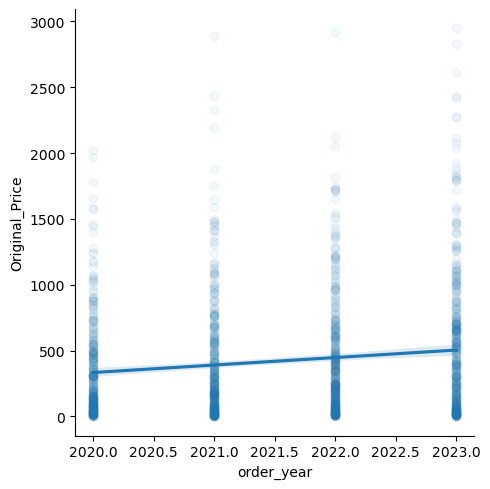

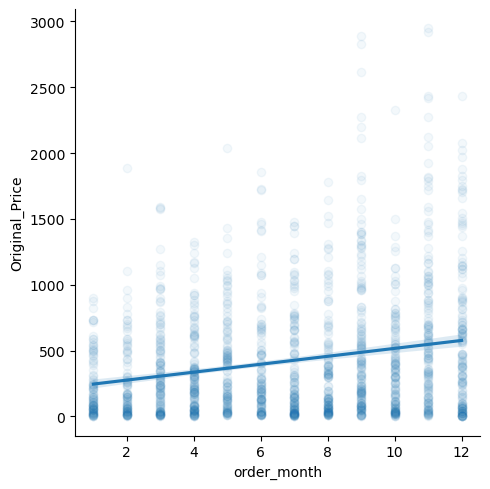

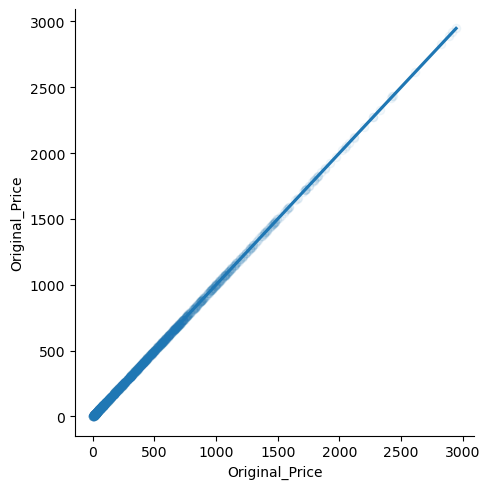

In [34]:
# Make visualizations to explore relationships between features and target

numeric = train.select_dtypes('number')
for feature in numeric:
    sns.lmplot(x=feature, y=target, data=train, scatter_kws={'alpha':0.05})
    plt.show()

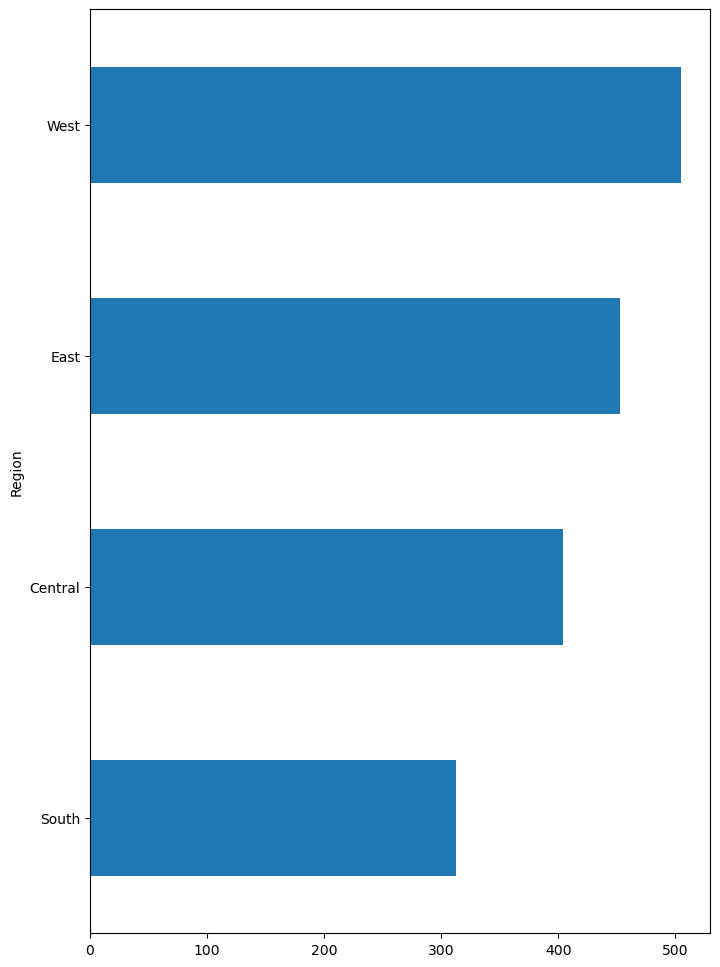

In [35]:
# Make visualizations to explore relationships between features and target
plt.figure(figsize=(8,12))
train.groupby('Region')['Original_Price'].mean().sort_values().plot.barh();

In [36]:
# For this stretch goal, students only have to report validation MAE and R^2 
# But this function goes further: RMSE, MAE, R^2, for train & validation sets.

import numpy as np
from sklearn.metrics import mean_squared_error

def lr(train, val, features, target):
    X_train = train[features]
    y_train = train[target]
    X_val = val[features]
    y_val = val[target]

    encoder = ce.OneHotEncoder(use_cat_names=True)
    model = LinearRegression()
    X_train_encoded = encoder.fit_transform(X_train)
    X_val_encoded = encoder.transform(X_val)
    model.fit(X_train_encoded, y_train)
    y_pred_train = model.predict(X_train_encoded)
    y_pred_val = model.predict(X_val_encoded)

    print(f'Linear Regression with {len(features)} features: {features}')
    print('Train Root Mean Squared Error:', 
          np.sqrt(mean_squared_error(y_train, y_pred_train)))
    print('Validation Root Mean Square Error:', 
          np.sqrt(mean_squared_error(y_val, y_pred_val)))
    print('Train Mean Absolute Error:', 
          mean_absolute_error(y_train, y_pred_train))
    print('Validation Mean Absolute Error:', 
          mean_absolute_error(y_val, y_pred_val))
    print('Train R^2 Score:', 
          r2_score(y_train, y_pred_train))
    print('Validation R^2 Score:', 
          r2_score(y_val, y_pred_val))

In [37]:
# Just 1 feature
features = ['Category']
lr(train, val, features, target)

Linear Regression with 1 features: ['Category']
Train Root Mean Squared Error: 432.7022017648019
Validation Root Mean Square Error: 379.9895141563537
Train Mean Absolute Error: 317.5700458115183
Validation Mean Absolute Error: 287.1489086294416
Train R^2 Score: 0.10601500721040491
Validation R^2 Score: 0.12759727215743777


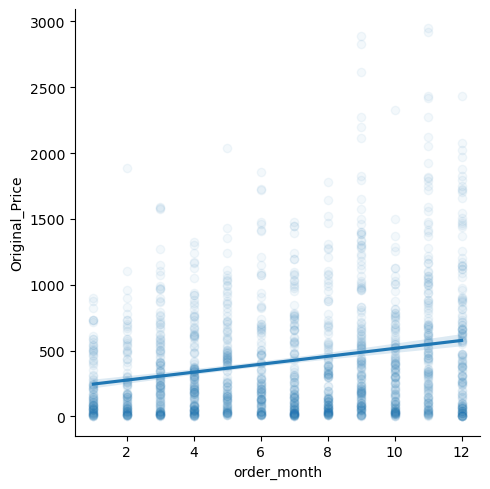

In [38]:
# First, we'll wrangle a feature ...
# In the EDA viz, the line of best fit seemed wrong for 'Lot_Area', 
# like it was influenced by outliers
sns.lmplot(x='order_month', y=target, data=train, scatter_kws={'alpha':0.05});

In [91]:
# This certainly isn't required, but we'll wrangle this feature:
def wrangle(X):
    X = X.copy()
    X['Original_Price_Clipped'] = X['Original_Price'].clip(lower=0, upper=4000)
    return X

train = wrangle(train)
val = wrangle(val)
test = wrangle(test)

In [92]:
# Before:
features = ['Original_Price']
lr(train, val, features, target)

Linear Regression with 1 features: ['Original_Price']
Train Root Mean Squared Error: 2.044571797481042e-13
Validation Root Mean Square Error: 1.8461736327274632e-13
Train Mean Absolute Error: 1.435559059642277e-13
Validation Mean Absolute Error: 1.3391543936927866e-13
Train R^2 Score: 1.0
Validation R^2 Score: 1.0


In [93]:
# After:
features = ['Original_Price_Clipped']
lr(train, val, features, target)

Linear Regression with 1 features: ['Original_Price_Clipped']
Train Root Mean Squared Error: 2.044571797481042e-13
Validation Root Mean Square Error: 1.8461736327274632e-13
Train Mean Absolute Error: 1.435559059642277e-13
Validation Mean Absolute Error: 1.3391543936927866e-13
Train R^2 Score: 1.0
Validation R^2 Score: 1.0


In [94]:
# 2. Automatically select features, then do ridge regression

from sklearn.feature_selection import f_regression, SelectKBest

# Arrange X, y
features = train.columns.drop([target, 'Original_Price'])
X_train = train[features]
X_val = val[features]

# One-hot encode
encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)

# Scale
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_val_scaled = scaler.transform(X_val_encoded)

# Next sprint, to do hyperparameter optimization, 
# we'll use RandomizedSearchCV instead of for loops
ks = range(1, len(X_train_encoded.columns)+1)
maes = []
for k in ks:
    # Select K best features
    selector = SelectKBest(score_func=f_regression, k=k)
    X_train_selected = selector.fit_transform(X_train_scaled, y_train)
    X_val_selected = selector.transform(X_val_scaled)
    
    # Fit Ridge Regression, use cross-validation to optimize alpha
    model = RidgeCV()
    model.fit(X_train_selected, y_train)
    
    # Get Validation MAE
    y_pred = model.predict(X_val_selected)
    mae = mean_absolute_error(y_val, y_pred)
    maes.append(mae)

    
print('Best K & Validation MAE:')
[(k, mae) for k, mae in zip(ks, maes) if mae==min(maes)]

Best K & Validation MAE:


[(1, 0.02068997307134989)]

In [95]:
# Report test MAE, R^2 for final model

X_train = train[features]
X_test = test[features]

encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_test_scaled = scaler.transform(X_test_encoded)

selector = SelectKBest(score_func=f_regression, k=26)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_val_scaled)

model = RidgeCV()
model.fit(X_train_encoded, y_train)
y_pred_test = model.predict(X_test_encoded)

print(f'Ridge Regression, final model')
print('Test Mean Absolute Error:', mean_absolute_error(y_test, y_pred_test))
print('Test R^2 Score:', r2_score(y_test, y_pred_test))

Ridge Regression, final model
Test Mean Absolute Error: 0.00039215466957022064
Test R^2 Score: 0.9999999999987014


In [96]:
# Print coefficients for the features
print('Intercept', model.intercept_)
coefficients = pd.Series(model.coef_, X_train_encoded.columns)
print(coefficients.to_string())

Intercept 0.00042811610541093614
order_year                  2.632162e-08
order_month                 2.155961e-08
Region_Central             -5.034815e-09
Region_South               -6.155803e-08
Region_East                 1.287214e-08
Region_West                 5.372071e-08
Category_Technology         4.325190e-08
Category_Office Supplies   -7.496236e-08
Category_Furniture          3.171046e-08
Sub-Category_Accessories    4.235538e-08
Sub-Category_Appliances     4.515459e-08
Sub-Category_Envelopes     -8.874447e-08
Sub-Category_Machines      -1.376838e-07
Sub-Category_Phones         1.733876e-07
Sub-Category_Art           -5.919320e-08
Sub-Category_Storage        2.200691e-07
Sub-Category_Bookcases     -5.408336e-08
Sub-Category_Binders        1.074172e-07
Sub-Category_Fasteners     -1.486216e-07
Sub-Category_Paper          9.064347e-08
Sub-Category_Supplies      -1.298660e-07
Sub-Category_Furnishings   -1.015409e-08
Sub-Category_Copiers       -3.480734e-08
Sub-Category_Labels     

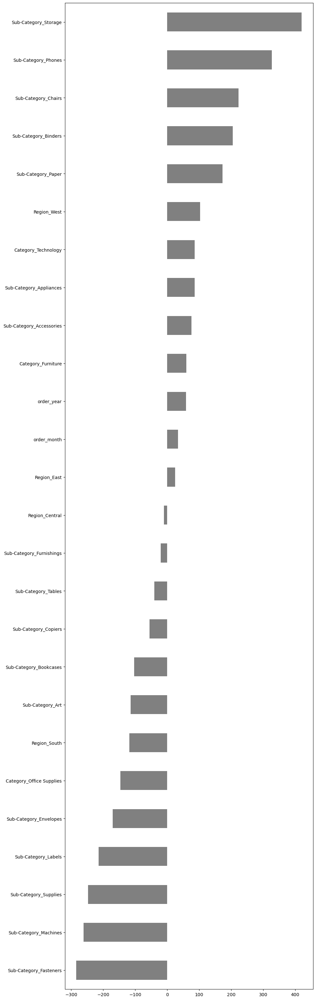

In [90]:
# Or, plot coefficients
%matplotlib inline
coefficients.sort_values().plot.barh(color='grey', figsize=(10,40));